# EDA for hard to detect Objects


This exploratory data analysis aims to help understand the structure, contents and special features of the DOTA datset. It is done in preparation of more sophisticated usecases later on. First, the dataset has to be downloaded from [Dota Dataset](https://captain-whu.github.io/DOTA/dataset.html) and put in the following order structure in the same repository as this file:
- data
   - images_test
        - P0006.png
        - P0009.png
        - P0014.png
        - ...
   - images_train
        - P0000.png
        - P0001.png
        - P0002.png
        - ...
   - images_val
        - P0003.png
        - P0004.png
        - P0007.png
        - ...
   - labels_test
        - test_info.json
   - labels_train
        - P0000.txt
        - P0001.txt
        - P0002.txt
        - ...
   - labels_val
        - P0003.txt
        - P0004.txt
        - P0007.txt
        - ...
    
In this EDA we will focus on the Instacnes that were labeled as "hard to detect" by the authors of the dataset. The EDA for all instances is done seperately in another jupyter notebook.

## 1. Import modules

In [1]:
# Mangement of files
import os
from os.path import join
import json
from glob import glob
from natsort import natsorted

# For Visualization
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Rectangle

# Working with arrays
import numpy as np

# String manipulation
import re

# Math modules
import math
import random

PROJECT_DIR = os.getcwd()

## 2. Create Train-, Validation- and Test-set

First the train-, validation- and test-set have to be created. The split of the dataset is already given, therefore the equivalence of the number of images and targets in both the train- and validation-set according to the documentation of the dataset is checked.

Some functions to accomplish the tasks:

In [2]:
def read_txt(path):
    with open(path, 'r') as file:
        lines = file.readlines()
    return lines

In [3]:
def load_json(path):
    with open(path, 'r') as f:
        data = json.load(f)
    return data

In [4]:
def count_files(path):
    count=0
    for a, _, files in os.walk(path):
        for file in files:
            if not file.startswith("."): # because hidden files start with "." on Mac, need to be excluded
                count+=1
    return count

Create paths to all images and targets and print out the number of images and targets:

In [5]:
target_train_path=os.path.join(PROJECT_DIR,'data','labels_train')
images_train_path=os.path.join(PROJECT_DIR,'data','images_train')
target_val_path=os.path.join(PROJECT_DIR,'data','labels_val')
images_val_path=os.path.join(PROJECT_DIR,'data','images_val')
images_test_path=os.path.join(PROJECT_DIR,'data','images_test')
labels_test_path=os.path.join(PROJECT_DIR,'data','labels_test','test_info.json')

num_targets_train=count_files(target_train_path)
num_images_train=count_files(images_train_path)
num_targets_val=count_files(target_val_path)
num_images_val=count_files(images_val_path)
num_images_test=count_files(images_test_path)
total=num_targets_train+num_targets_val+num_images_test

print("Number of train images: \t{} \nNumber of train targets: \t{} ".format(num_images_train, num_targets_train))
print("Number of val images: \t{} \nNumber of val targets: \t{} ".format(num_images_val, num_targets_val))
print("Number of test images: \t{} ".format(num_images_test))
print("In Total: {} ".format(total))

Number of train images: 	1411 
Number of train targets: 	1411 
Number of val images: 	458 
Number of val targets: 	458 
Number of test images: 	937 
In Total: 2806 


After checking the number of images and targets in the train-, validation- and test-set, the total number of image-target pairs of 2806 is coherent with the website. The exact split in training, validation and testig differs slightly from the information on the website, but we consider this small deviation as not significant.

| Set      | Website | Actual |
|-----------|-----|--------|
| Train-set      | 1403  | 1411   |
| Validation-set      | 468  | 458 |
| Test-set   | 935  | 937   |
|Total|2806|2806|


As it can be seen in the original EDA, the labels for the test images are missing. To be able to train the network properly we will be using the validation data as the new test data and split the train data again into train and validation data. For the follwoing EDA we will reference to the train and validation data only and ignore the test images, due to the missing labels.

Create lists with paths to all images and targets:

In [6]:
list_train_images = glob(join(images_train_path, "**", "*.png"),recursive=True)
list_train_images = natsorted(list_train_images, key=lambda y: y.lower())
list_train_targets = glob(join(target_train_path, "**", "*.txt"),recursive=True)
list_train_targets = natsorted(list_train_targets, key=lambda y: y.lower())

list_val_images = glob(join(images_val_path, "**", "*.png"),recursive=True)
list_val_images = natsorted(list_val_images, key=lambda y: y.lower())
list_val_targets = glob(join(target_val_path, "**", "*.txt"),recursive=True)
list_val_targets = natsorted(list_val_targets, key=lambda y: y.lower())



From here on the EDA is changed, focussing on the instances that are labeled with a "1" for hard-to-detect"

First we count all the instances and categorize them in lists for hard and easy to detect instances.

In [7]:
from tabulate import tabulate

def create_new_target_lists(target_path_list):
    instances_easy = {'container-crane': 0,
                'ship': 0,
                'storage-tank': 0,
                'baseball-diamond': 0,
                'tennis-court': 0,
                'basketball-court': 0,
                'ground-track-field': 0,
                'bridge': 0,
                'large-vehicle': 0,
                'small-vehicle': 0,
                'helicopter': 0,
                'swimming-pool': 0,
                'roundabout': 0,
                'soccer-ball-field': 0,
                'plane': 0,
                'harbor': 0
            }
    instances_hard = {'container-crane': 0,
                'ship': 0,
                'storage-tank': 0,
                'baseball-diamond': 0,
                'tennis-court': 0,
                'basketball-court': 0,
                'ground-track-field': 0,
                'bridge': 0,
                'large-vehicle': 0,
                'small-vehicle': 0,
                'helicopter': 0,
                'swimming-pool': 0,
                'roundabout': 0,
                'soccer-ball-field': 0,
                'plane': 0,
                'harbor': 0
            }
    for i in range (0,len(target_path_list)-1):
        objects =read_txt(target_path_list[i])
        for box in objects[2:]:
            information = box.strip().split()
            class_label=information[8]
            difficulty = int(information[-1])
            if difficulty == 1:
                instances_hard[class_label] += 1
            elif difficulty == 0:
                instances_easy[class_label] += 1

    headers = ["Class Label", "Instances (Easy)", "Instances (Hard)"]
    table_data = []
    for key in instances_easy.keys():
        table_data.append([key, instances_easy[key], instances_hard[key]])
    
    print(tabulate(table_data, headers, tablefmt="grid"))


In [8]:
print("Train targets:")
create_new_target_lists(list_train_targets)

print("\n \n Validation targets:")
create_new_target_lists(list_val_targets)


Train targets:
+--------------------+--------------------+--------------------+
| Class Label        |   Instances (Easy) |   Instances (Hard) |
+====================+====================+====================+
| container-crane    |                142 |                  0 |
+--------------------+--------------------+--------------------+
| ship               |              30476 |               2497 |
+--------------------+--------------------+--------------------+
| storage-tank       |               4180 |               1166 |
+--------------------+--------------------+--------------------+
| baseball-diamond   |                407 |                  5 |
+--------------------+--------------------+--------------------+
| tennis-court       |               2331 |                 94 |
+--------------------+--------------------+--------------------+
| basketball-court   |                477 |                 52 |
+--------------------+--------------------+--------------------+
| ground-t

## 3. Visualization of images and targets

some functions to accomplish the task:

In [9]:
def extract_hbb(pxl_coordinates: list):
    bounding_boxes_easy=[]
    bounding_boxes_hard=[]
    for location in pxl_coordinates[2:]:
        parts = location.strip().split()
        x_min=float(parts[0])
        y_min=float(parts[1])
        x_max=float(parts[4])
        y_max=float(parts[5])
        class_label=parts[8]
        if (int(parts[-1]) == 1):
            bounding_boxes_hard.append({'label':class_label,
                                  'x_min':x_min,
                                  'y_min':y_min,
                                  'x_max':x_max,
                                  'y_max':y_max})
        else:
           bounding_boxes_easy.append({'label':class_label,
                                  'x_min':x_min,
                                  'y_min':y_min,
                                  'x_max':x_max,
                                  'y_max':y_max}) 
    return bounding_boxes_hard, bounding_boxes_easy

In [10]:
colors = {
    'container-crane': 'blue',
    'ship': 'red',
    'storage-tank': 'green',
    'baseball-diamond': 'yellow',
    'tennis-court': 'purple',
    'basketball-court': 'orange',
    'ground-track-field': 'pink',
    'bridge': 'turquoise',
    'large-vehicle': 'brown',
    'small-vehicle': 'azure',
    'helicopter': 'lime',
    'swimming-pool': 'cyan',
    'roundabout': 'magenta',
    'soccer-ball-field': 'gold',
    'plane': 'lime',
    'harbor': 'indigo'
}

In [11]:
def create_custom_legend(labels,axes):
    bbox_to_anchor=(1.04, 1)
    handles = []
    color_list=[]
    for label in labels:
        color_list.append(colors[label])
    for color, label in zip(color_list, labels):
        handle = Rectangle((0, 0), 1, 1, color=color, label=label)
        handles.append(handle)
    axes.legend(handles=handles,  loc="upper left", bbox_to_anchor=bbox_to_anchor)

In [12]:
def print_target_from_index(image_path_list, target_path_list, index):
    image = Image.open(image_path_list[index])
    fig, ax = plt.subplots()
    ax.imshow(image)
    hbb=read_txt(target_path_list[index])
    hbb_hard,_=extract_hbb(hbb)
    for box in hbb_hard:
        if box['label'] in colors:
            color=colors[box['label']]
        xmin, xmax, ymin, ymax, label = box['x_min'], box['x_max'], box['y_min'], box['y_max'], box['label']
        rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
    create_custom_legend(get_unique_labels(target_path_list, index),ax)
    plt.show()

In [13]:
def image_path_to_target_path(image_path):
    pattern = "images_train" + os.sep
    target_path = image_path.replace(pattern, "labels_train" + os.sep )
    target_path = target_path.replace("png", "txt")
    return target_path

In [14]:
def target_path_to_image_path(target_path):
    pattern = re.escape("labels_train")
    image_path = re.sub(pattern, "images_train", target_path)
    image_path = image_path.replace("txt", "png")
    return image_path

In [15]:
def print_target_from_image_path(image_path):
    target_path=image_path_to_target_path(image_path)
    image = Image.open(image_path)
    fig, ax = plt.subplots()
    ax.imshow(image)
    hbb=read_txt(target_path)
    hbb_hard,_=extract_hbb(hbb)
    for box in hbb_hard:
        if box['label'] in colors:
            color=colors[box['label']]
        xmin, xmax, ymin, ymax = box['x_min'], box['x_max'], box['y_min'], box['y_max']
        rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
    create_custom_legend(get_unique_labels(image_path_to_target_path(image_path)),ax)
    plt.show()

In [16]:
def get_unique_labels(target_path_list,index=-1):
    unique_names = set()
    if index==-1:
        txt_file=read_txt(target_path_list)
    else:
        txt_file=read_txt(target_path_list[index])
    hbb_list_hard,_=extract_hbb(txt_file)
    for d in hbb_list_hard:
        name = d["label"]
        unique_names.add(name)
    unique_names=list(unique_names)
    return unique_names

In [17]:
def get_number_of_instances(target_path_list,index):
    unique_names=get_unique_labels(target_path_list, index)
    txt_file=read_txt(target_path_list[index])
    hbb_list_hard,_=extract_hbb(txt_file)
    dic={item: 0  for item in unique_names}
    for box in hbb_list_hard:
        if box["label"] in dic.keys():
            dic[box["label"]]+=1
    return dic

There are 928 images in the Trainingset with 'hard-to-detect' instances on them.
Here is an example of an image with those instances:


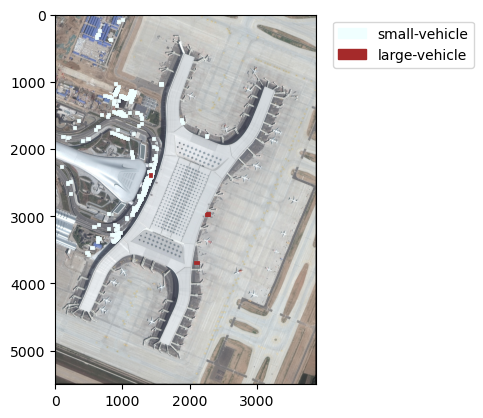

{'small-vehicle': 237, 'large-vehicle': 4}
Further there are 300 images in the Validationset with 'hard-to-detect' instances on them.
Here is an example of an image with those instances:


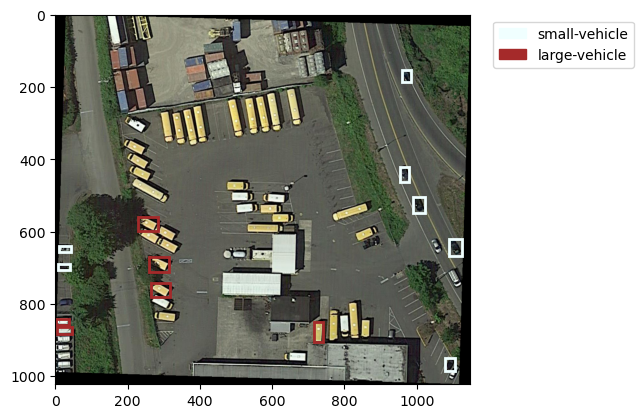

{'small-vehicle': 7, 'large-vehicle': 6}


In [18]:
i = 0
images_with_hard_instaces = []
for image in list_train_targets:
    txt_file=read_txt(image)
    hard, easy =extract_hbb(txt_file)
    if len(hard) != 0:
        images_with_hard_instaces.append(i)
    i += 1

print("There are {} images in the Trainingset with 'hard-to-detect' instances on them.".format(len(images_with_hard_instaces)))
print("Here is an example of an image with those instances:")
target_index= 0
print_target_from_index(list_train_images, list_train_targets, target_index)
example=get_number_of_instances(list_train_targets,target_index)
print(example)

i = 0
images_with_hard_instaces = []
for image in list_val_targets:
    txt_file=read_txt(image)
    hard, easy =extract_hbb(txt_file)
    if len(hard) != 0:
        images_with_hard_instaces.append(i)
    i += 1
    
print("Further there are {} images in the Validationset with 'hard-to-detect' instances on them.".format(len(images_with_hard_instaces)))
print("Here is an example of an image with those instances:")
target_index= 0
print_target_from_index(list_val_images, list_val_targets, target_index)
example=get_number_of_instances(list_val_targets,target_index)
print(example)

In these examples it can be seen, that most of the as "hard-to-detect" labeled instances are either very small, partly hidden under trees or similar or are about the same color as the ground they are on (as for example the 3 cars on the road on the validation image shown above).

To investigate this further, we plot more images:

Image Index: 766


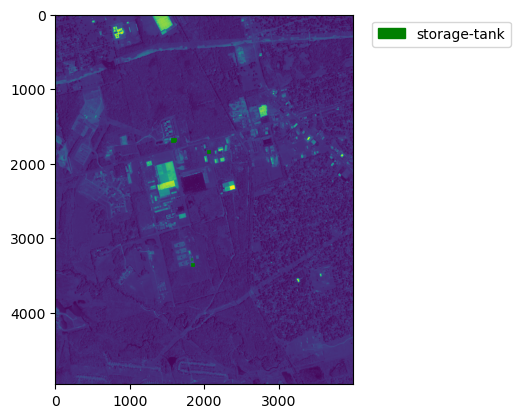

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 405


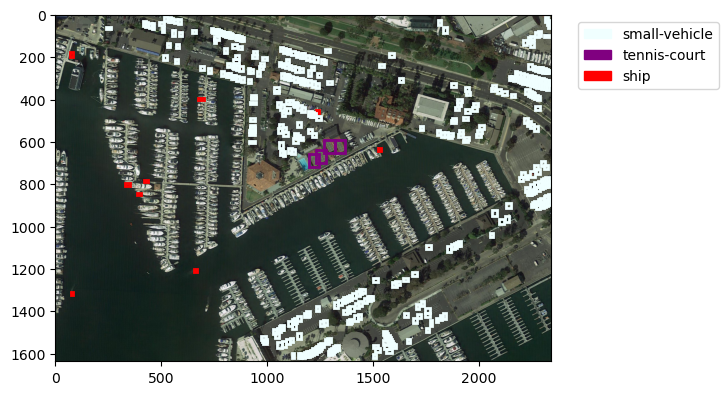

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 345


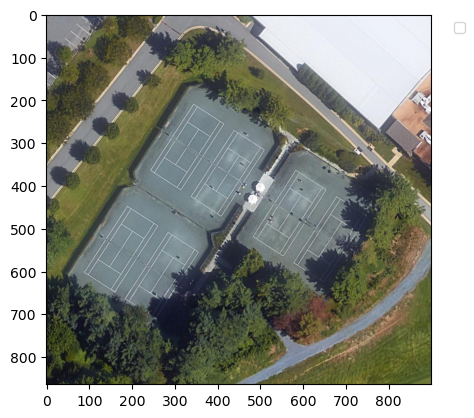

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 63


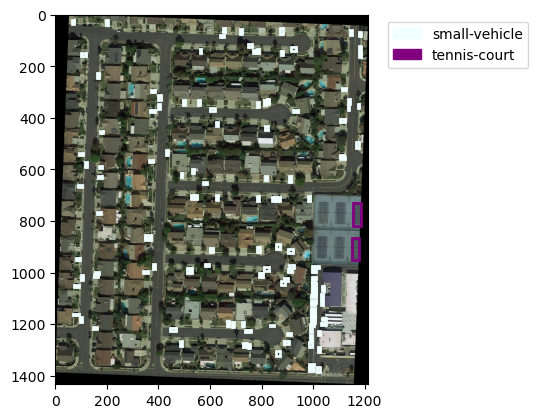

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 8


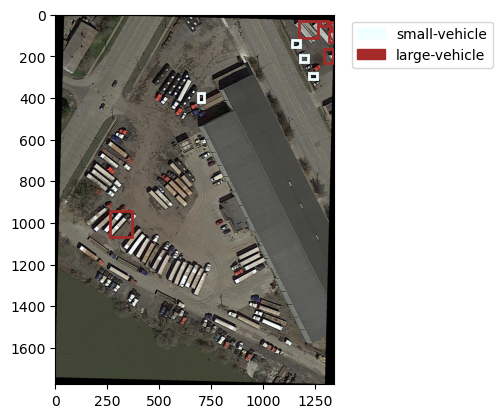

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 302


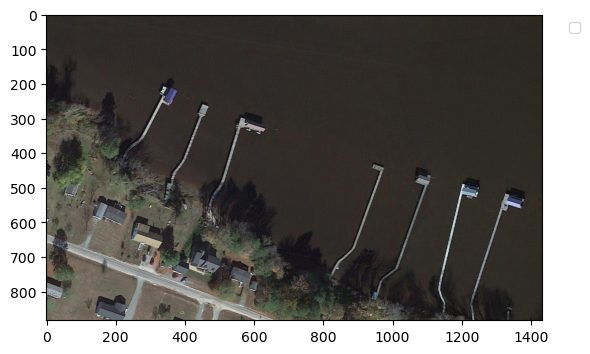

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 504


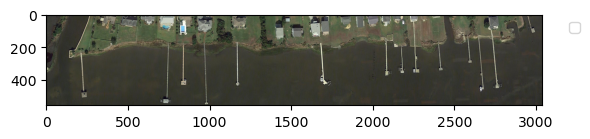

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 537


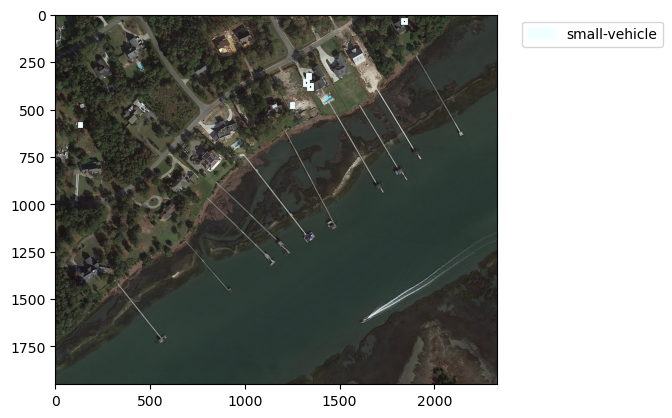

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 161


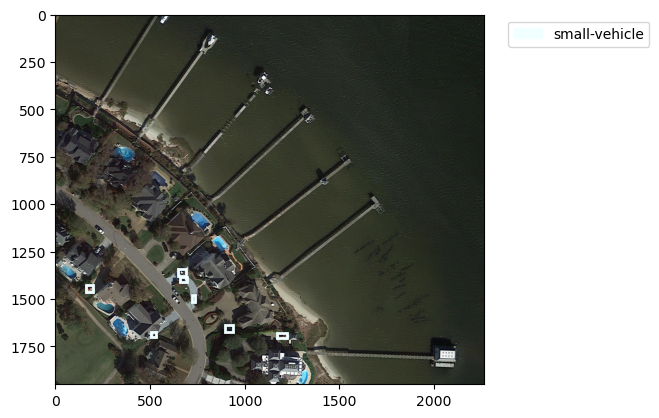

{'small-vehicle': 237, 'large-vehicle': 4}
Image Index: 457


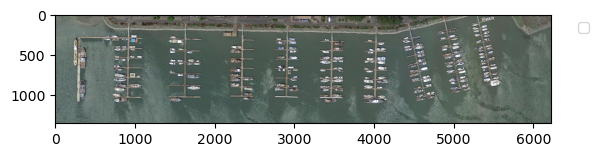

{'small-vehicle': 237, 'large-vehicle': 4}


In [19]:
for i in range (0,10):
    random_index = random.randint(1, 1000)
    print("Image Index: {}".format(random_index))

    print_target_from_index(list_train_images, list_train_targets, random_index)
    example=get_number_of_instances(list_train_targets,target_index)
    print(example)

We notice that most of the instances are just very small in comparison to the rest of the images. 
Some of the Instances are hidden partly. 
In some images the instances are actually rather large, for example:

Index 465 - harbor
Index 62 - ship
index 596 - large vehicles
Index 74 - soccer-ball-field
Index 324 - harbor
Index 71 - soccer-ball-field
Index 706 - ships 
Index 270 - swimming pool

While some of these images are hard to understand why they are labeled as "hard-to-detect", some of them can be explained. For example the swimmingpool in Image 270 is on the corner of the image and therefore one corner is cut. This results in an untypical shape for a pool. Likewise thje soccerball field in Image 74. It lies in the middle of a ground track field and blends in with the surrounding grass. This makes it hard to detect even for the human eye.  

## 4. Number of Instances

After the number of images and targets were scrutinized, now the focus shifts to the number of instances in the training- and validation-set.

In [20]:
def get_total_number_of_instances(target_path_list, plot=False):
    total_instances={}
    for i, _ in enumerate(target_path_list):
        number_instances=get_number_of_instances(target_path_list,i)
        for key, value in number_instances.items():
            total_instances[key]=total_instances.get(key, 0) + value
    total_instances = dict(sorted(total_instances.items(), key=lambda item: item[1], reverse=True))
    sum_instances=sum(total_instances.values())
    print("{:<15} {:>15} | {:>3}".format("label","# of instances", "in %"))
    print("_________________________________________")
    percent_list=[]
    for key, item in total_instances.items():
        percent=100*(item/sum_instances)
        percent_list.append(percent)
        print('{:<20} {:>10} | {:>4.2f} %'.format(key, item, percent))
    print("_________________________________________")
    print('{:<20} {:>10} | {:>4.2f} %'.format("sum", sum_instances, sum(percent_list)))
    if plot:
        keys=list(total_instances.keys())
        values=list(total_instances.values())
        n_classes=len(keys)
        bar_width = 0.25
        br=np.arange(n_classes)
        
        plt.figure(figsize=(18,5), dpi=90)
        plt.bar(br, values, width=bar_width, color="blue")
        plt.xticks([r for r in range(n_classes)], keys, rotation=45)
        plt.title("Number of samples per class")
        plt.show()
    return total_instances
        

For the training-set:

We can see that most instances are small-vehicles, followed by large-vehicles and ships. The least frequent instances are baseballdiamond and helicopter. It is important to notice that there are no "hard-to-detect" instances of container crane. 


label            # of instances | in %
_________________________________________
small-vehicle             87220 | 91.53 %
large-vehicle              3624 | 3.80 %
ship                       2497 | 2.62 %
storage-tank               1166 | 1.22 %
bridge                      166 | 0.17 %
plane                       144 | 0.15 %
soccer-ball-field           111 | 0.12 %
tennis-court                 94 | 0.10 %
swimming-pool                92 | 0.10 %
harbor                       64 | 0.07 %
basketball-court             52 | 0.05 %
ground-track-field           37 | 0.04 %
roundabout                   13 | 0.01 %
helicopter                    7 | 0.01 %
baseball-diamond              5 | 0.01 %
_________________________________________
sum                       95292 | 100.00 %


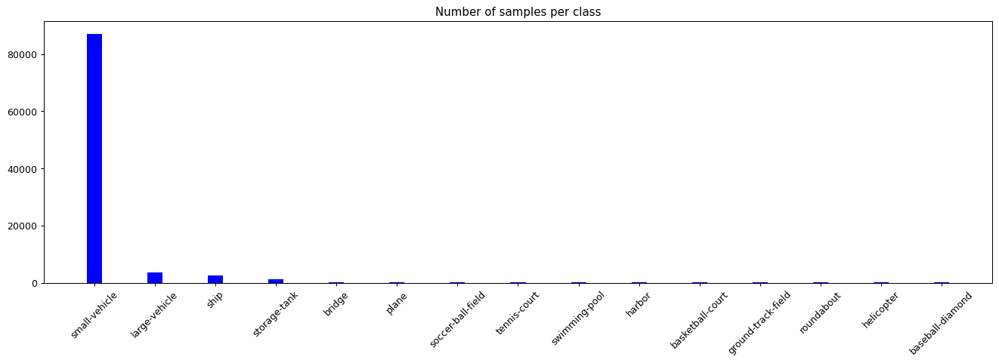

In [21]:
total_train_instances=get_total_number_of_instances(list_train_targets, True)

For the validation-set:

label            # of instances | in %
_________________________________________
small-vehicle             33047 | 92.93 %
storage-tank               1052 | 2.96 %
ship                        560 | 1.57 %
large-vehicle               530 | 1.49 %
swimming-pool               113 | 0.32 %
plane                        81 | 0.23 %
soccer-ball-field            60 | 0.17 %
bridge                       39 | 0.11 %
harbor                       19 | 0.05 %
tennis-court                 19 | 0.05 %
roundabout                   15 | 0.04 %
ground-track-field           12 | 0.03 %
basketball-court              8 | 0.02 %
baseball-diamond              5 | 0.01 %
helicopter                    1 | 0.00 %
_________________________________________
sum                       35561 | 100.00 %


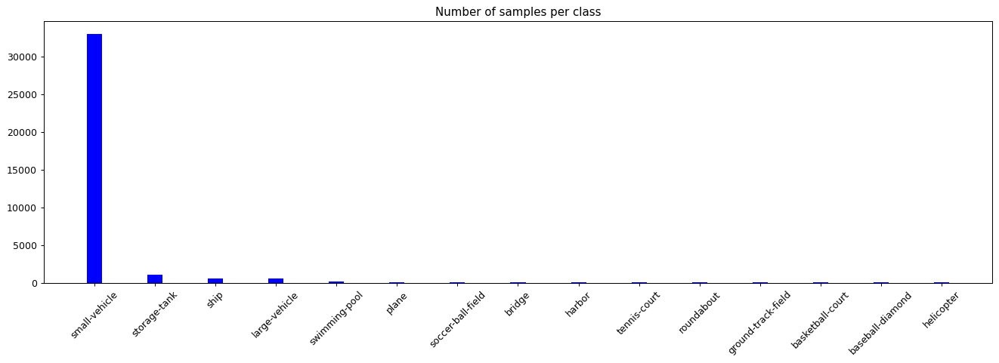

In [22]:
total_val_instances=get_total_number_of_instances(list_val_targets, True)

The number of instances are not well balanced in both the training and the validation set.

## 5. Object Aspect Ratios

In [23]:
def get_object_ratios(target_path_list, plot=False):
    object_ratio_dic={}
    for path in target_path_list:
        hbb=read_txt(path)
        hbb, _=extract_hbb(hbb)
        object_ratio_list=[]
        for box in hbb:
            xmin, xmax, ymin, ymax = box['x_min'], box['x_max'], box['y_min'], box['y_max']
            width=xmax-xmin
            height=ymax-ymin
            aspect_ratio=width/height
            object_ratio_list.append(aspect_ratio)
        object_ratio_dic[path]=object_ratio_list
            
    if plot:
        all_aspect_ratios = [value for sublist in object_ratio_dic.values() for value in sublist]
        fig, axs=plt.subplots(1,2, figsize=(12,5))
        axs[0].hist(all_aspect_ratios, bins=50, color='skyblue', edgecolor='black')
        axs[0].set_xlabel('Object Aspect Ratios')
        axs[0].set_ylabel('Frequency')
        axs[0].set_title('Histogram of Object Aspect Ratios')

        axs[1].boxplot(all_aspect_ratios)
        axs[1].set_ylabel('Omage aspect')
        axs[1].set_title('Boxplot of Object Aspect Ratios')
        plt.show()

    return object_ratio_dic

In the histogram and boxplot of the Object Aspect Ratios, a right skewed distribution of aspect ratios is visible. 

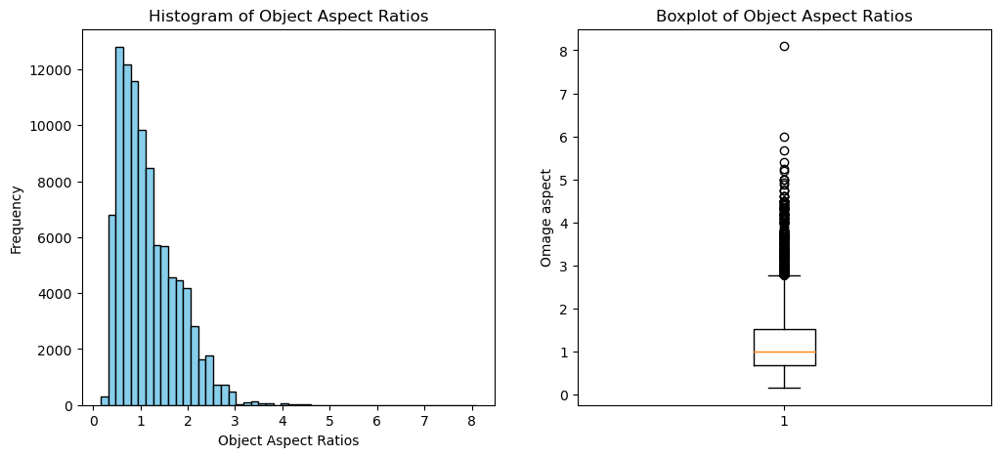

In [24]:
object_ratio_dict=get_object_ratios(list_train_targets, True)
all_aspect_ratios = [value for sublist in object_ratio_dict.values() for value in sublist]


top_10_max_values = sorted(all_aspect_ratios, reverse=True)[:9]
keys_with_top_values = {}
for key, values in object_ratio_dict.items():
    key_value_list=[]
    for value in values:
        if value in top_10_max_values:
            key_value_list.append(value)
    if len(key_value_list)!=0:
        keys_with_top_values[key]=key_value_list

keys_with_top_values = dict(sorted(keys_with_top_values.items(), key=lambda item: item[1]))

In [25]:
list_or = [value for value_list in object_ratio_dict.values() for value in value_list]
print("{:<12}{:<12}{:<12}".format("Mean", "Median", "SD"))
print(28*"_")
print("{:<12.2f}{:<12.2f}{:<12.2f}".format(np.mean(list_or), np.median(list_or), np.std(list_or)))

Mean        Median      SD          
____________________________
1.16        1.00        0.61        


In [26]:
def find_object_from_aspect_ratio_mod(key_dict):
    dimensions =math.ceil(np.sqrt(sum(len(lst) for lst in key_dict.values())))
    fig, axes = plt.subplots(dimensions,dimensions, figsize=(15, 9))
    axes = axes.flatten()
    counter=0
    aspect_ratio_list=[]
    for key, item in key_dict.items():
        for ar in item:
            aspect_ratio_list.append(ar)
    aspect_ratio_list=sorted(aspect_ratio_list, reverse=True)
    reminder=[]
    for key, item in key_dict.items():
        
        image_path=target_path_to_image_path(key)
        image = Image.open(image_path)
        
        hbb=read_txt(key)
        hbb, _=extract_hbb(hbb)
        

        for box in hbb:
            xmin, xmax, ymin, ymax, label = box['x_min'], box['x_max'], box['y_min'], box['y_max'], box['label']
            width=xmax-xmin
            height=ymax-ymin
            aspect_ratio=width/height
            
            for ar in item:
                if ar==aspect_ratio:
                    if aspect_ratio not in reminder:
                        position=aspect_ratio_list.index(ar)
                        reminder.append(ar)
                    else:
                        position=aspect_ratio_list.index(ar)+1 #Because there can be aspect ratios that are the same for two bounding boxes
                    axes[position].imshow(image)
                    axes[position].set_title("{} Aspect ratio: {:.3f}".format(label, aspect_ratio))
                    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
                    axes[position].add_patch(rect)

                    counter+=1
        if counter>=int(dimensions**2):
            break
    plt.tight_layout()
    plt.show()

Images with targets that have the highest aspect ratio


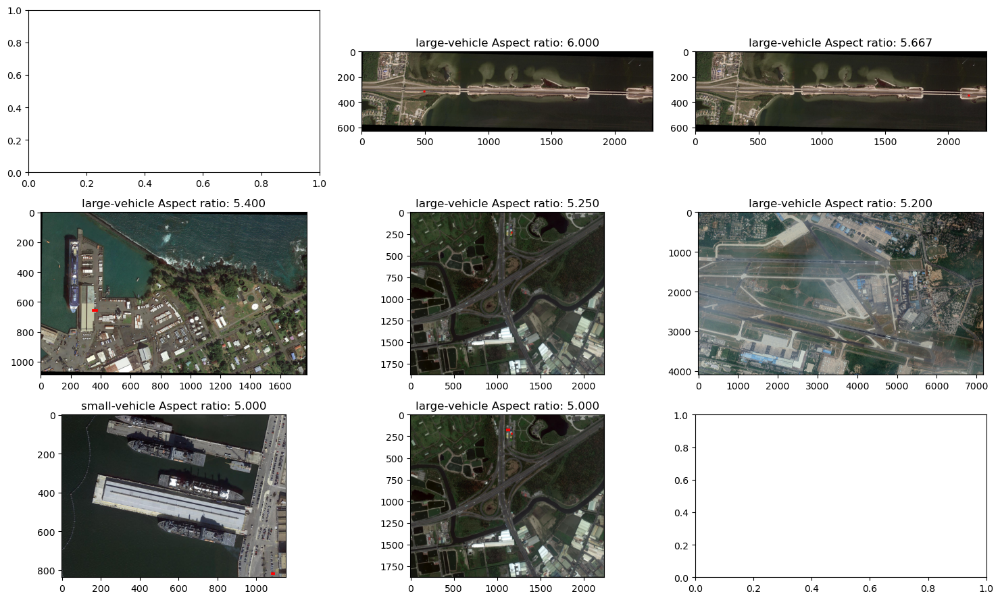

In [27]:
print("Images with targets that have the highest aspect ratio")
find_object_from_aspect_ratio_mod(keys_with_top_values)

In [28]:
all_aspect_ratios = [value for sublist in object_ratio_dict.values() for value in sublist]

bottom_10_max_values = sorted(all_aspect_ratios)[:8]
keys_with_bottom_values = {}
for key, values in object_ratio_dict.items():
    key_value_list=[]
    for value in values:
        if value in bottom_10_max_values:
            key_value_list.append(value)
    if len(key_value_list)!=0:
        keys_with_bottom_values[key]=key_value_list

keys_with_bottom_values = dict(sorted(keys_with_bottom_values.items(), key=lambda item: item[1]))

Images with targets that have the lowest aspect ratio


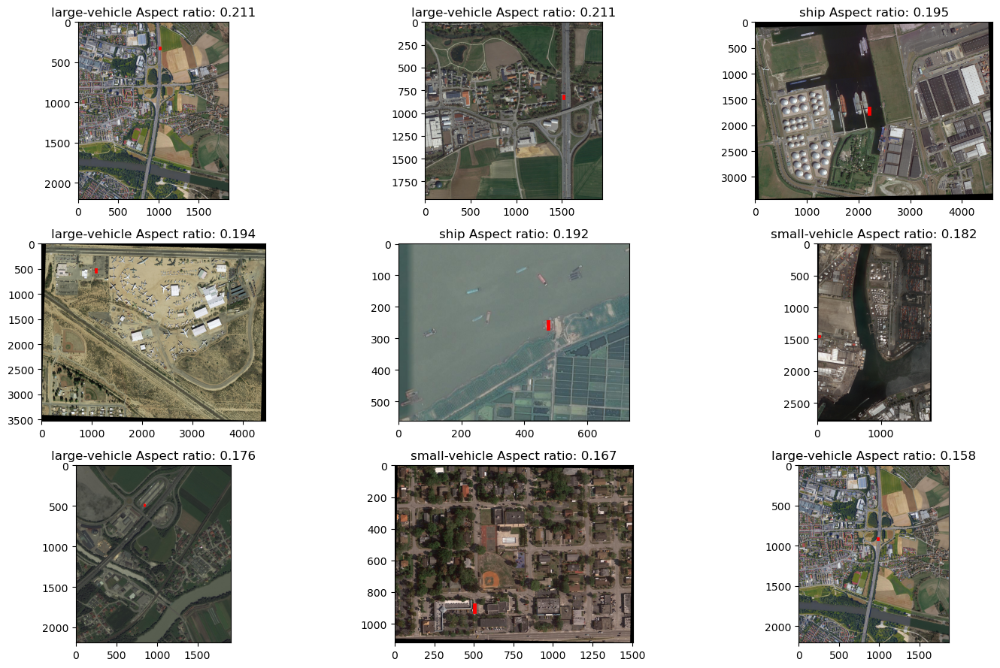

In [29]:
print("Images with targets that have the lowest aspect ratio")
find_object_from_aspect_ratio_mod(keys_with_bottom_values)

When compared to the original EDA we can see that the hard to detect images have a smaller range of aspect ratios. While all the instances together go from 0.035 to 21.53 the "hard-to-detect" instances vary between 0.158 and 6.00. This can be explained due to the larger area an extreme aspect ratio normaly has.

## 6. Class Aspect Ratio 

Looking at the object aspect ratios in general is not enough, as 16 classes are employed in the dataset. An analysis for each class is necessary to fully understand the distribution of object aspect ratios. Container-cranes are not longer relevant for the eda, since there are no instances for them that are labeled as "hard-to-detect".

In [30]:
def get_class_aspect_ratios(target_path_list, plot=False):
    class_ratio_dic={}
    for path in target_path_list:
        hbb=read_txt(path)
        hbb, _=extract_hbb(hbb)
        for box in hbb:
            xmin, xmax, ymin, ymax, label = box['x_min'], box['x_max'], box['y_min'], box['y_max'], box['label']
            width=xmax-xmin
            height=ymax-ymin
            aspect_ratio=width/height
            if label in class_ratio_dic:
                class_ratio_dic[label].append(aspect_ratio)
            else:
                class_ratio_dic[label] = [aspect_ratio]
            
    if plot:
        fig, axes = plt.subplots(4,4, figsize=(15, 9))
        axes = axes.flatten()
        for i, (key, value) in enumerate(class_ratio_dic.items()):
            ax = axes[i]  # Get the current axis
            ax.hist(value, bins=int(max(value)*10), color='blue', alpha=0.7)
            ax.set_xlim(0, 5)
            ax.set_title(key)
            ax.set_xlabel('Aspect ratio')
            ax.set_ylabel('Frequency')
        plt.tight_layout()
        plt.show()

    return class_ratio_dic

Here the distribution of the object ratios of each class is displayed. Classes like 'small-vehicle', 'large-vehicle', 'ship', 'harbor', 'ground-track-field', 'soccer-ball-field', 'tennis-court', 'basketball-court' and 'bridge' all have a right skewed distribution with outliers with high aspect ratio. On the other hand classes like 'plane', 'storage-tank', 'baseball-diamond', 'roundabout' or 'helicopter' have a symmetric shape and a small standard deviation, therefore they are centered around their mean. The highest average aspect ratios are present in bridges and the highest median is in swimming-pools. Helicopters have the lowest mean and median object aspect ratio.

We restricted the x axes from 0 to 5 for visualization purposes.

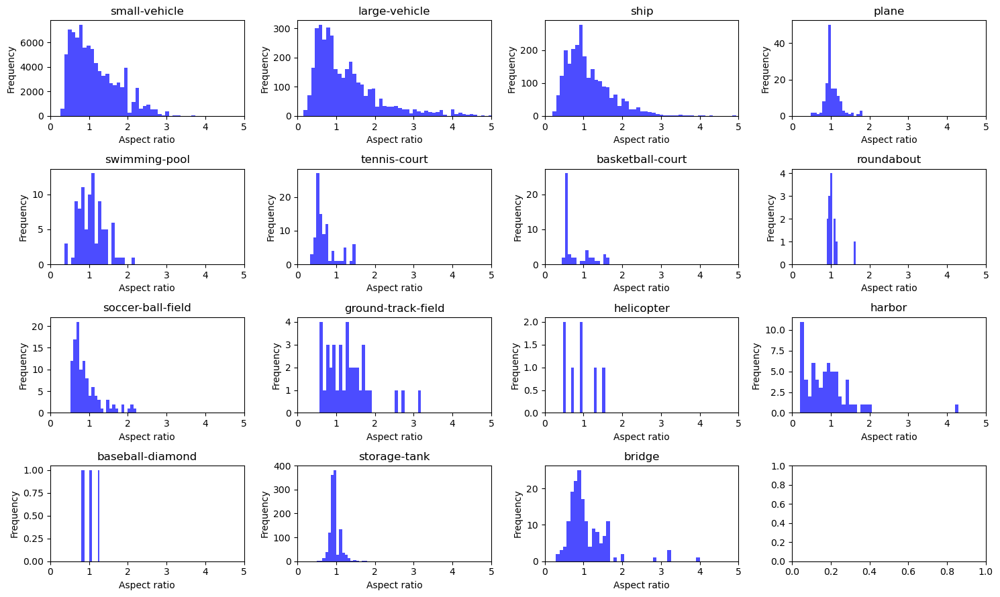

In [31]:
class_aspect_ratio_dic=get_class_aspect_ratios(list_train_targets, True)

In [32]:
print("{:<23}{:<12}{:<12}{:<12}".format("Label","Mean", "Median", "SD"))
print(100*"_")
total_area=0
percentages=[]
names=[]
for key, item in class_aspect_ratio_dic.items():
    print("{:<23}{:<12.2f}{:<12.2f}{:<12.2f}".format(key,np.mean(item), np.median(item), np.std(item)))

all_classes=[]
for key, item in object_ratio_dict.items():
    all_classes+=item

print(100*"_")
print("{:<23}{:<12.2f}{:<12.2f}{:<12.2f}".format("All",np.mean(all_classes), np.median(all_classes), np.std(all_classes)))

Label                  Mean        Median      SD          
____________________________________________________________________________________________________
small-vehicle          1.16        1.00        0.60        
large-vehicle          1.26        1.00        0.84        
ship                   1.14        0.97        0.62        
plane                  1.04        1.00        0.21        
swimming-pool          1.08        1.00        0.34        
tennis-court           0.71        0.61        0.29        
basketball-court       0.80        0.58        0.36        
roundabout             1.05        1.00        0.18        
soccer-ball-field      0.92        0.81        0.37        
ground-track-field     1.30        1.26        0.59        
helicopter             0.92        0.90        0.37        
harbor                 0.88        0.87        0.62        
baseball-diamond       1.00        1.01        0.16        
storage-tank           0.98        1.00        0.13        

## 7. Bounding Box Sizes

Not only the bounding box/object aspect ratio is analysed, but also the size of the bounding boxes, which will deliver a different picture.

In [33]:
def get_bounding_box_sizes(target_path_list, plot=False):
    hbb_size_dic={}
    for path in target_path_list:
        hbb=read_txt(path)
        hbb, _=extract_hbb(hbb)
        for box in hbb:
            xmin, xmax, ymin, ymax, label = box['x_min'], box['x_max'], box['y_min'], box['y_max'], box['label']
            width=xmax-xmin
            height=ymax-ymin
            area=width*height
            if path in hbb_size_dic:
                hbb_size_dic[path].append(area)
            else:
                hbb_size_dic[path] = [area]
    if plot:
        all_hbb_sizes = [value for sublist in hbb_size_dic.values() for value in sublist]
        fig, axs=plt.subplots(1,2, figsize=(12,5))
        
        axs[1].boxplot(np.log(all_hbb_sizes))#,bins=100)
        axs[1].set_ylabel('Log Bounding Box Area')
        axs[1].set_title('Boxplot of Bounding Box Areas')
    

        axs[0].hist(np.log(all_hbb_sizes), bins=150, color='skyblue', edgecolor='black')
        axs[0].set_xlabel('Log Bounding Box Area in pixels')
        axs[0].set_ylabel('Frequency')
        axs[0].set_title('Histogram of Bounding Box Areas')

        plt.show()
    return hbb_size_dic

Looking at the boxplot and histogram for the bounding box areas, it is visible, that the distribution is right skewed with large outliers to the right. Also the boxplot indicates that most bounding boxes have a small area and there are a lot of outliers.

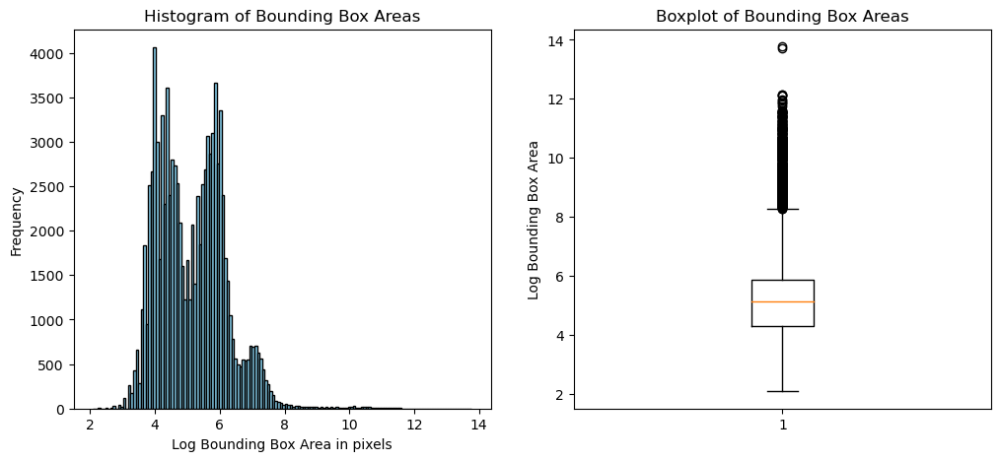

In [34]:
hbb_sizes=get_bounding_box_sizes(list_train_targets,True)
all_hbb_sizes = [value for sublist in hbb_sizes.values() for value in sublist]
all_hbb_sizes=sorted(all_hbb_sizes, reverse=True)

In [35]:
list_or = [value for value_list in hbb_sizes.values() for value in value_list]
print("{:<12}{:<12}{:<12}".format("Mean", "Median", "SD"))
print(28*"_")
print("{:<12.2f}{:<12.2f}{:<12.2f}".format(np.mean(list_or), np.median(list_or), np.std(list_or)))

Mean        Median      SD          
____________________________
453.94      168.00      5184.47     


## 8. Class Bounding Box Sizes

Again, the bounding box sizes of all classes have to be investigated individually to determine class differences.

In [36]:
def find_object_from_hbb_size(key_dict):
    for key, item in key_dict.items():
        
        image_path=target_path_to_image_path(key)
        image = Image.open(image_path)
        fig, ax = plt.subplots()
        ax.imshow(image)
        hbb=read_txt(key)
        hbb, _=extract_hbb(hbb)
        for box in hbb:
            xmin, xmax, ymin, ymax, label = box['x_min'], box['x_max'], box['y_min'], box['y_max'], box['label']
            width=xmax-xmin
            height=ymax-ymin
            area=width*height
            if area in item:
                print("Area: {} pixel".format(area))
                rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                break
        plt.title("{} area: {} pixel".format(label,area)) 
        plt.show()

In [37]:
def get_class_bounding_box_sizes(target_path_list, plot=False):
    hbb_size_dic={}
    hbb_size_path_dic={}
    for path in target_path_list:
        hbb=read_txt(path)
        hbb, _=extract_hbb(hbb)
        for box in hbb:
            xmin, xmax, ymin, ymax, label = box['x_min'], box['x_max'], box['y_min'], box['y_max'], box['label']
            width=xmax-xmin
            height=ymax-ymin
            area=width*height
            if label in hbb_size_dic:
                hbb_size_dic[label].append(area)
            else:
                hbb_size_dic[label] = [area]
            if path in hbb_size_path_dic:
                hbb_size_path_dic[path].append(area)
            else:
                hbb_size_path_dic[path] = [area]
            
            
    if plot:
        fig, axes = plt.subplots(4,4, figsize=(15, 9))
        axes = axes.flatten()
        label_list=[]
        for i, (key, value) in enumerate(hbb_size_dic.items()):
            ax = axes[i]  
            bin_width=1000
            number_of_bins=int(max(value)/bin_width)
            ax.hist(value, bins=300, color='blue', alpha=0.7)
            ax.set_xlim(0, max(value))
            ax.set_title(key)
            label_list.append(key)
            ax.set_xlabel('Bounding Box Area in pixels')
            ax.set_ylabel('Frequency')
        plt.tight_layout()

        fig, axes = plt.subplots(4,4, figsize=(15, 9))
        axes = axes.flatten()
        for i, (key, value) in enumerate(hbb_size_dic.items()):
            ax = axes[i]  
            log_values = [math.log(x) for x in value]
            ax.boxplot(log_values)
            ax.set_title("{}".format(key))
            
            ax.set_ylabel('Log Area')
        plt.xticks([])
        plt.tight_layout()


        
        fig, axes = plt.subplots(4,4, figsize=(15, 9))
        axes = axes.flatten()
        for i, (key, value) in enumerate(hbb_size_dic.items()):
            ax = axes[i]
            image_path=''
            for path, areas in hbb_size_path_dic.items():
                if max(value) in areas:
                    image_path=target_path_to_image_path(path)
            image = mpimg.imread(image_path)
            hbb=read_txt(image_path_to_target_path( image_path))
            hbb, _=extract_hbb(hbb)
            for box in hbb:
                xmin, xmax, ymin, ymax, label = box['x_min'], box['x_max'], box['y_min'], box['y_max'], box['label']
                width=xmax-xmin
                height=ymax-ymin
                area=width*height
                if area==max(value):
                    rect = plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=2, edgecolor='r', facecolor='none')
                    ax.add_patch(rect)
                    
            ax.axis('off')
            ax.set_title("{}: {:.0f} pixel".format(label_list[i], max(value)))
            ax.imshow(image)
        plt.tight_layout()
        plt.show()

    return hbb_size_dic

In the histograms and logarithmic boxplots we can see that there are different sizes of every object-class and additionally some large outliers in most cases. To visualize these large outliers, below the boxplot the largest instance of each object is potrayed.

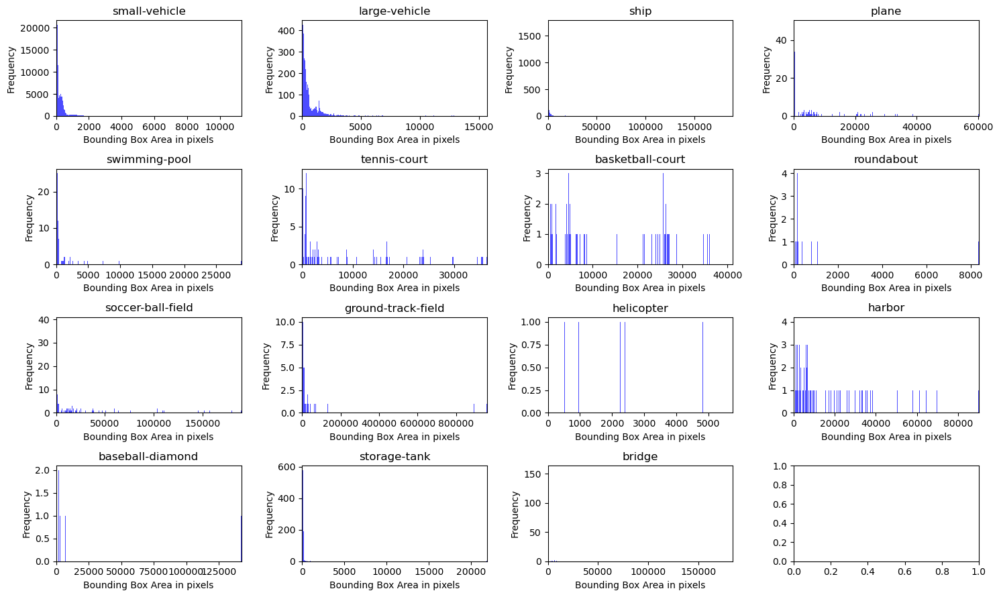

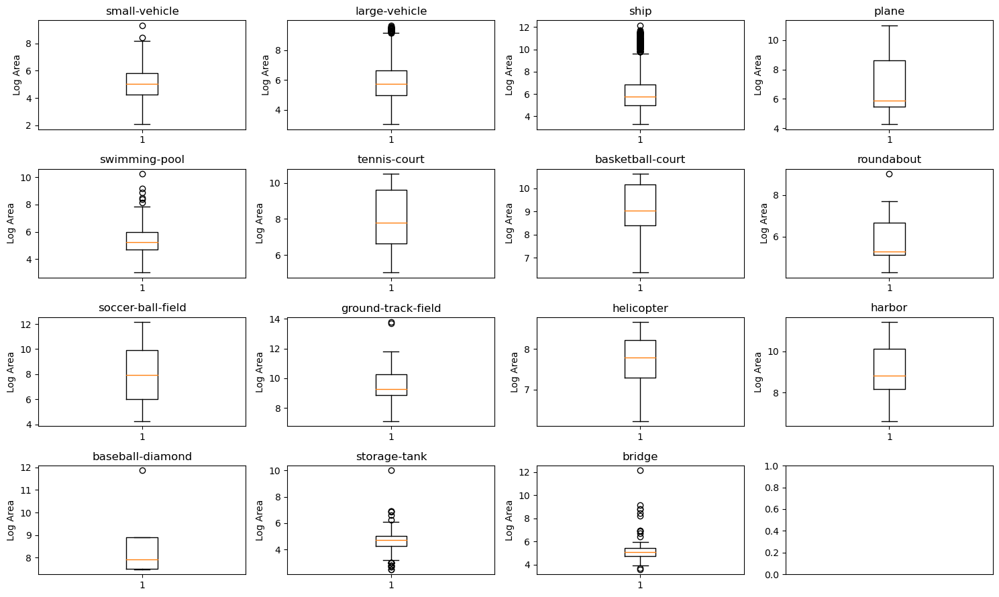

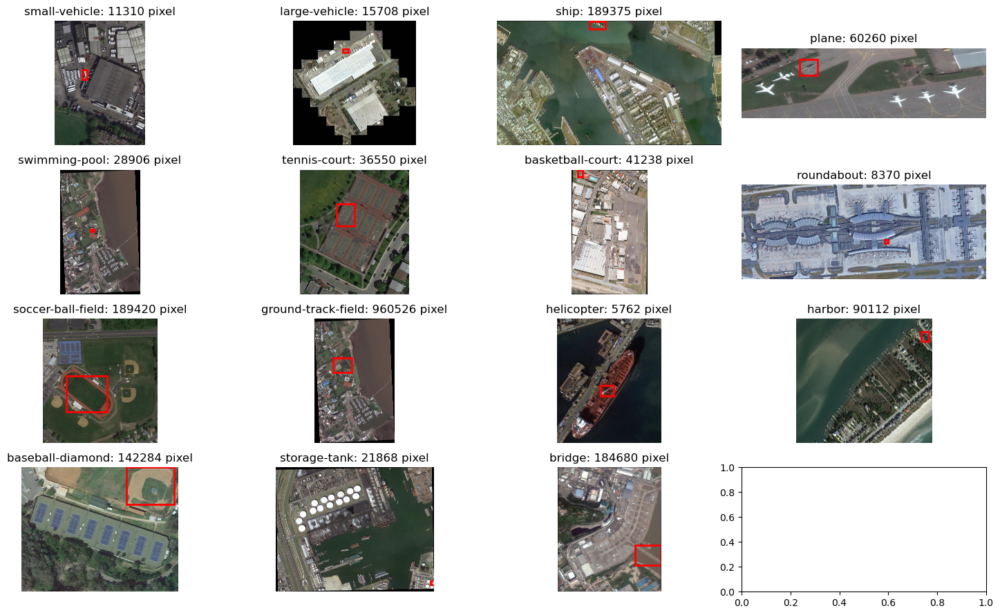

In [38]:
hbb_size_dic=get_class_bounding_box_sizes(list_train_targets, True)


Three Largest Boundings Boxes with Labels:
Area: 960526.0 pixel


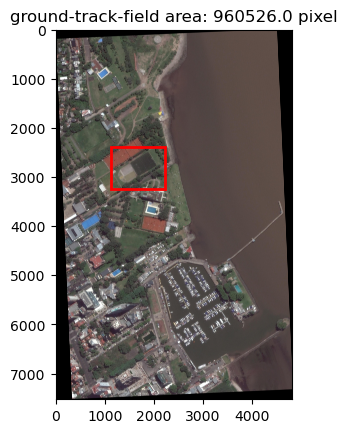

Area: 891050.0 pixel


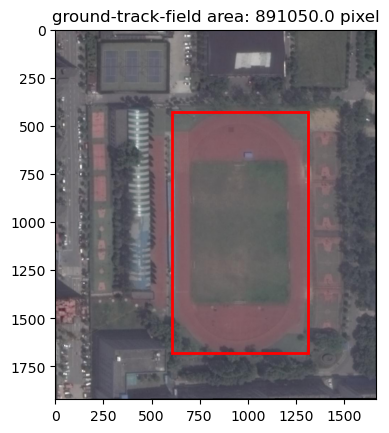

Area: 189420.0 pixel


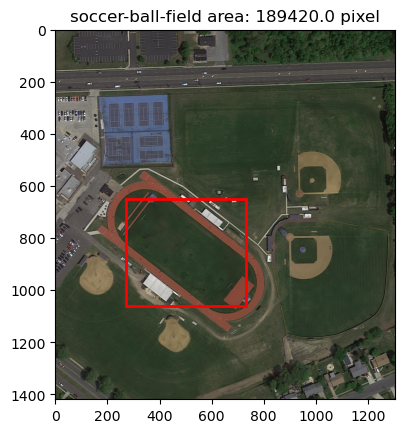

In [39]:
top_max_boxes=all_hbb_sizes[:3]
keys_with_top_values = {}
for key, values in hbb_sizes.items():
    key_value_list=[]
    for value in values:
        if value in top_max_boxes:
            key_value_list.append(value)
    if len(key_value_list)!=0:
        keys_with_top_values[key]=key_value_list

keys_with_top_values = dict(sorted(keys_with_top_values.items(), key=lambda item: item[1], reverse=True))
print("Three Largest Boundings Boxes with Labels:")
find_object_from_hbb_size(keys_with_top_values)

Here we notice something quit interesting. Even though the areas are very large, so that the network would have enough input to detect it, the objects are labeled as "hard-to-detect". The answer can be found when looking at the label of the instance. They are all three labeled as small car, even though they are football or ground track fields. This explains why a network doesnt detect them as labeled: Because there is no resemblance with the labeled class.

This brings in a new challenge, that has to be faced while, training. In best case all images have to be looked at and all wrong labeled instances have to be cut. 

In [40]:
all=get_bounding_box_sizes(list_train_targets)
all_classes=[]
for key, item in all.items():
    all_classes+=item

print("{:<23}{:<12}{:<12}{:<12}{:<12}{:<12}".format("Label","Mean", "Median", "SD","Sum Area","Percentage"))
print(100*"_")
total_area=0
percentages=[]
names=[]
for key, item in hbb_size_dic.items():
    total_area+=np.sum(item)
for key, item in hbb_size_dic.items():
    names.append(key)
    percentage=np.sum(item)*100/total_area
    percentages.append(percentage)
    print("{:<23}{:<12.1f}{:<12.1f}{:<12.1f}{:<12.1f}{:<12.1f}".format(key,np.mean(item), np.median(item), np.std(item),np.sum(item),percentage))
print(100*"_")
print("{:<23}{:<12.1f}{:<12.1f}{:<12.1f}{:<12.1f}{:<12.1f}".format("All",np.mean(all_classes), np.median(all_classes), np.std(all_classes),np.sum(all_classes),np.sum(all_classes)*100/total_area))

Label                  Mean        Median      SD          Sum Area    Percentage  
____________________________________________________________________________________________________
small-vehicle          264.1       156.0       312.5       23031780.0  53.2        
large-vehicle          767.8       308.0       1454.1      2782633.0   6.4         
ship                   3384.7      325.0       12659.4     8451532.0   19.5        
plane                  5069.3      361.0       9154.6      729981.0    1.7         
swimming-pool          1004.9      189.0       3271.4      92454.0     0.2         
tennis-court           8156.1      2427.0      10391.8     766673.0    1.8         
basketball-court       15094.0     8407.5      12074.5     784889.0    1.8         
roundabout             1101.6      196.0       2177.3      14321.0     0.0         
soccer-ball-field      21769.9     2800.0      39423.4     2416459.0   5.6         
ground-track-field     68489.1     10744.0     206576.9    

Looking at the area covered by the bounding boxes of each class we can see that this order does correlate to the number of instances per class. The most instances for example are from the class 'small-vehicle', and the most area is covered by bounding boxes from this class as well, followed by 'ship' instead of 'large-vehicles' which has the third larges area. From the standard deviation we can also see that most object areas have a wide range of variability .

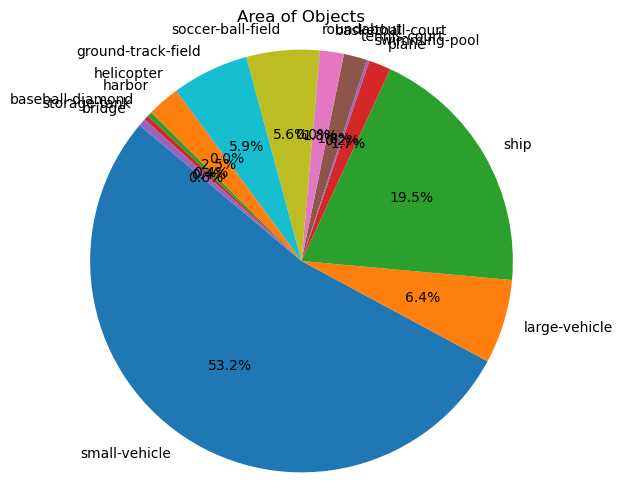

In [41]:
plt.figure(figsize=(6, 6))
plt.pie(percentages, labels=names, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Area of Objects')
plt.show()

## 9. Number of Instances per Image

At last, it is good to see how many instances there are in every image. The result of the analysis shows, that most images have less than 500 instances per image, but there are outliers who have much more instances per image. The one with the most instances is depicted after the diagramms. The mean is 149 instances and the median is 40 instances, which speaks for a right-skewed distribution as well.

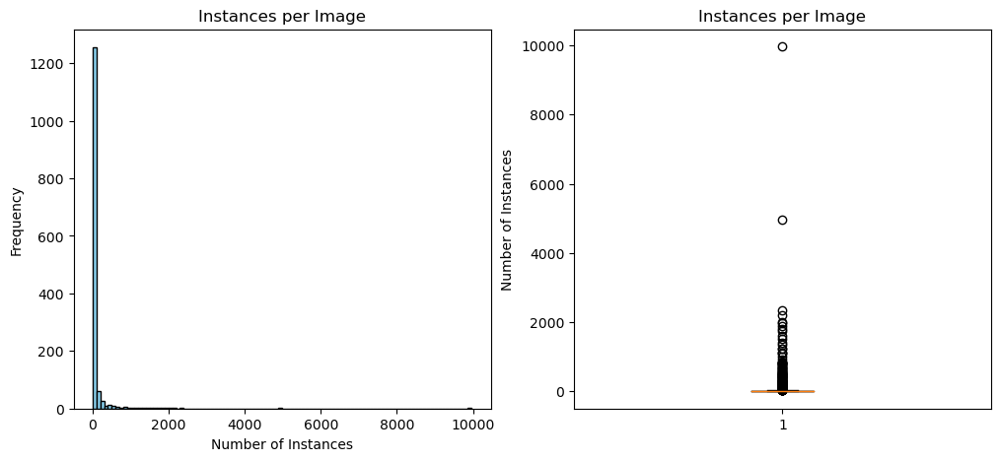

In [42]:
def get_number_instances_per_image(target_path_list, plot=False):
    number_of_instances={}
    for path in target_path_list:
        hbb=read_txt(path)
        hbb,_=extract_hbb(hbb)
        number_of_instances[path]=len(hbb)
    if plot:

        fig, axs=plt.subplots(1,2, figsize=(12,5))
        axs[1].boxplot(list(number_of_instances.values()))#,bins=100)
        axs[1].set_ylabel('Number of Instances')
        axs[1].set_title('Instances per Image')

        axs[0].hist(list(number_of_instances.values()), bins=100, color='skyblue', edgecolor='black')
        axs[0].set_xlabel('Number of Instances')
        axs[0].set_ylabel('Frequency')
        axs[0].set_title('Instances per Image')
        plt.show()
    return number_of_instances
instances=get_number_instances_per_image(list_train_targets, True)

In [43]:
print("{:<12}{:<12}{:<12}".format("Mean", "Median", "SD"))
print(28*"_")
print("{:<12.2f}{:<12.2f}{:<12.2f}".format(np.mean(list(instances.values())),
                                           np.median(list(instances.values())), 
                                           np.std(list(instances.values()))))

Mean        Median      SD          
____________________________
67.54       3.00        358.63      


The follwing is the image with the most instances on it:

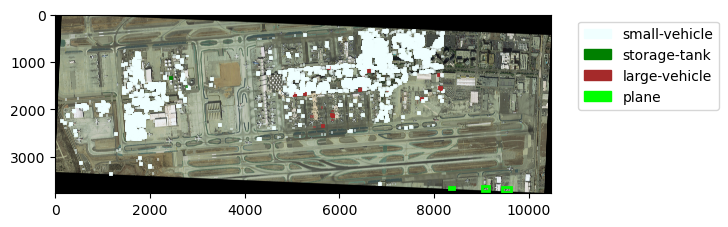

Path: C:\Users\Tim-A\Uni\Semester 4\Deep Learning\final project testing\data\labels_train\P1868.txt 
number of instances: 9968


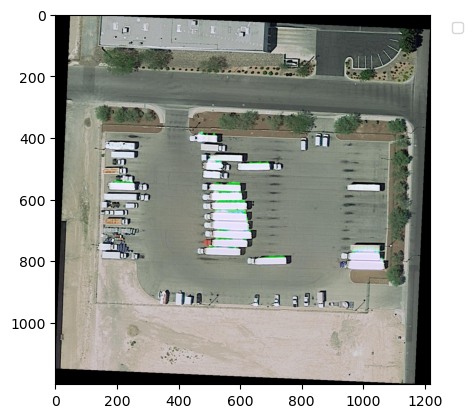

Path: C:\Users\Tim-A\Uni\Semester 4\Deep Learning\final project testing\data\labels_train\P0058.txt 
number of instances: 0


In [44]:
instances = dict(sorted(instances.items(),
                        key=lambda item: item[1],
                        reverse=True))
first_entry = next(iter(instances.items()))
instances = dict(sorted(instances.items(),
                        key=lambda item: item[1],
                        reverse=False))
last_entry = next(iter(instances.items()))
last_entry = next(iter(instances.items()))

print_target_from_image_path(target_path_to_image_path(first_entry[0]))
print("Path: {} \nnumber of instances: {}".format(first_entry[0],first_entry[1]))
print_target_from_image_path(target_path_to_image_path(last_entry[0]))
print("Path: {} \nnumber of instances: {}".format(last_entry[0],last_entry[1]))

The image with the most instances has 9968 instances and the ones with the least has 0 instances. As already stated earlier there are several images without any instances that are labeled "hard-to-detect".
Whats interesting is that the image with the most instances is still the same that has the most instances (10206) in general. But this time most of the planes and storage tanks are missing. 

## 10. Largest and Smallest Image

In [45]:
def get_image_sizes(image_path_list, plot=False):
    image_sizes={}
    for path in image_path_list:
        image=Image.open(path)
        width, height = image.size
        image_size=width*height
        image_sizes[path]=image_size
    return image_sizes

def get_X_sizes(image_path_list, plot=False):
    image_sizes={}
    for path in image_path_list:
        image=Image.open(path)
        width, height = image.size
        X_size=width
        image_sizes[path]=X_size
    return image_sizes

def get_Y_sizes(image_path_list, plot=False):
    image_sizes={}
    for path in image_path_list:
        image=Image.open(path)
        width, height = image.size
        Y_size=height
        image_sizes[path]=Y_size
    return image_sizes

Image size: 60313406


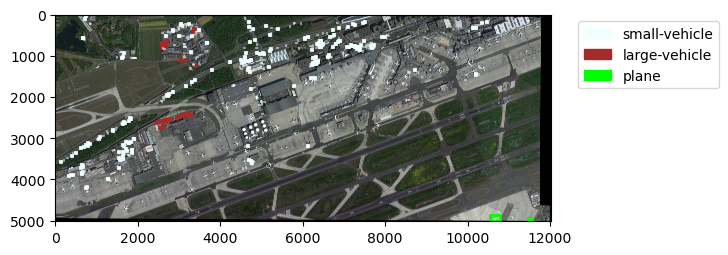

Image size: 145666


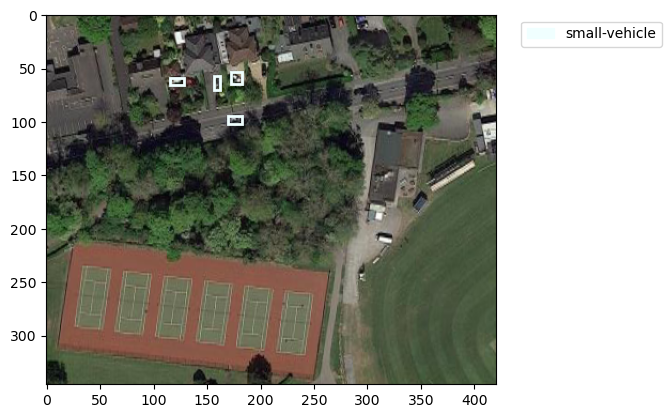

Image with the smalest X-size: 387


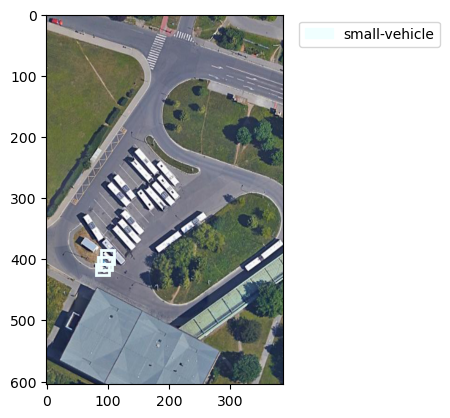

Image with the smalest Y-size: 278


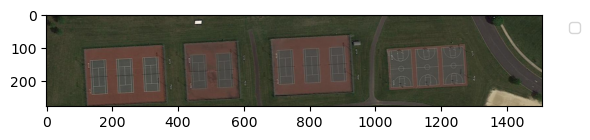

In [46]:
image_sizes=get_image_sizes(list_train_images)
image_sizes = dict(sorted(image_sizes.items(), key=lambda item: item[1], reverse=True))
image_sizes_path=list(image_sizes.keys())
image_sizes=list(image_sizes.values())
print("Image size: {}".format(image_sizes[0]))
print_target_from_image_path(image_sizes_path[0])
print("Image size: {}".format(image_sizes[-1]))
print_target_from_image_path(image_sizes_path[-1])


###Smallest X dimension
image_sizes=get_X_sizes(list_train_images)
image_sizes = dict(sorted(image_sizes.items(), key=lambda item: item[1], reverse=True))
image_sizes_path=list(image_sizes.keys())
image_sizes=list(image_sizes.values())
print("Image with the smalest X-size: {}".format(image_sizes[-1]))
print_target_from_image_path(image_sizes_path[-1])

###Smallest Y dimension
image_sizes=get_Y_sizes(list_train_images)
image_sizes = dict(sorted(image_sizes.items(), key=lambda item: item[1], reverse=True))
image_sizes_path=list(image_sizes.keys())
image_sizes=list(image_sizes.values())
print("Image with the smalest Y-size: {}".format(image_sizes[-1]))
print_target_from_image_path(image_sizes_path[-1])

## 11. Further Processing steps

Additionally to everything stated in the original EDA we also have to think of a way to train the network on the "hard-to-detect" instances without telling the network it is wrong when detecting an "easy-to-detect" instance. Two seperate Metrics would be useful in this case.

## 12. Metrics

To learn with this Dataset it is important to know which metrics can be used. 
After some research we found that the standard metrics for object detection are Precision, Recall, F1 score, IoU, the COCO mAP and the precision-recall curve. These metrics are computed from the following counts:

1. True Positive: The Pixels that are inside the boundaryboxes of the labeling as well as the prediction of the neural network
2. False Positive: The pixels, that are not in the boxes according to the labels but the neural network predicted them as part of the class
3. True Negative: The pixels that are not inside the boundary box according to the labels and the network did predict them as not part of the class correctly
4. False Negative: The pixels that should be inside the boundary box according to the labels but the network did not predict them as part of the class

With these four values the Metrics can be computed as follows:

Precision = (True Positive)/(True Positive + False Positive)

Recall = (True Positive)/(True Positive + False Negative)

F1 score = 2x (Precision × Recall)/(Precision + Recall)

Intersection over Union = TP/(TP + FN + FP)

Precision x Recall curve

COCO mean average precision
